# Init

In [1]:
import lovely_tensors as lt
lt.monkey_patch()

In [2]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [3]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

In [4]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [5]:
try:
    from prettytable import PrettyTable
except:
    ! pip install -q prettytable
    from prettytable import PrettyTable

def count_parameters(model):
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad: continue
        params = parameter.numel()
        table.add_row([name, params])
        total_params+=params
    print(table)
    print(f"Total Trainable Params: {total_params} type {type(model)}")
    return total_params

In [6]:
def get_cameraman_tensor(sidelength):
    pil_img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(pil_img)
    return img, pil_img

In [7]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img, pil_img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)
        self.pil_img = pil_img

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

In [8]:
import os
import random
import numpy as np
import torch

def seed_all(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [9]:
def mse_and_psnr(im_a, im_b, data_range=1): 
    data_range = 1.
    mse = F.mse_loss(im_a, im_b)
    psnr = 10 * torch.log10((data_range ** 2) / mse)
    return mse, psnr

In [10]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

/opt/conda/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [11]:
def to01(t):
    t = t - t.min()
    t = t / t.max()
    return t

# Train pipeline

In [12]:
def tensor2pil(t):
    return Image.fromarray((t.detach().cpu().clip(0, 1).numpy()*255).astype(np.uint8))

def pil2tensor(pil): return torch.tensor(
    np.asarray(pil).astype(np.float32)/255).permute(2, 0, 1)


def imagify_tensor(t): 
    return to01(t).cpu().view(256,256).detach()

In [13]:
def train(model, cfg):
    device = cfg['device']
    model.to(device)
    total_params = count_parameters(model)
    losses = []

    total_steps = cfg['total_steps']
    steps_til_summary = cfg['steps_til_summary']

    if cfg.get('use_wandb'):
        import wandb
        wandb.init(project=cfg['project'], name=cfg['experiment_name'], config=cfg)
        wandb.log({'total_params': total_params})

    optim = torch.optim.Adam(lr=cfg['lr'], params=model.parameters())

    model_input, ground_truth = next(iter(dataloader))
    model_input, ground_truth = model_input.to(device), ground_truth.to(device)

    for step in range(total_steps):
        model_output, coords = model(model_input)
        mse, psnr = mse_and_psnr(model_output, ground_truth)
        loss = mse

        if cfg.get('use_wandb'):
            wandb.log({'step': step, 'mse': mse.item(), 'psnr': psnr.item()})

        if not step % steps_til_summary:
            print(f"Step {step}, Total loss {loss:0.6f}")
            img_grad_tensor = gradient(model_output, coords)
            img_laplacian_tensor = laplace(model_output, coords)

            img = imagify_tensor(model_output)
            img_grad = imagify_tensor(img_grad_tensor.norm(dim=-1))
            img_laplacian = imagify_tensor(img_laplacian_tensor)

            colage = tensor2pil(torch.cat([img, img_grad, img_laplacian], dim=1))
            plt.imshow(colage)
            plt.show()

            if cfg.get('use_wandb'):
                wandb.log({'step': step, 'image': wandb.Image(colage)})

        optim.zero_grad()
        loss.backward()
        optim.step()
        losses.append(loss.item())

    wandb.finish()

# SIREN

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   65536    |
|  net.1.linear.bias  |    256     |
| net.2.linear.weight |   65536    |
|  net.2.linear.bias  |    256     |
| net.3.linear.weight |   65536    |
|  net.3.linear.bias  |    256     |
|     net.4.weight    |    256     |
|      net.4.bias     |     1      |
+---------------------+------------+
Total Trainable Params: 198401 type <class '__main__.Siren'>


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kilianovski. Use `wandb login --relogin` to force relogin


Step 0, Total loss 0.325139


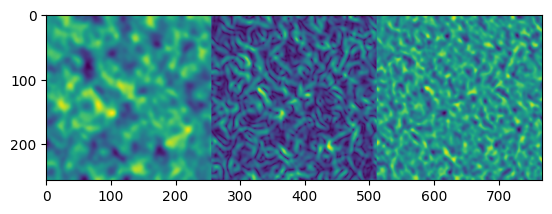

Step 100, Total loss 0.007755


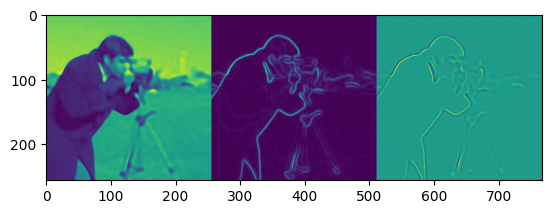

Step 200, Total loss 0.003262


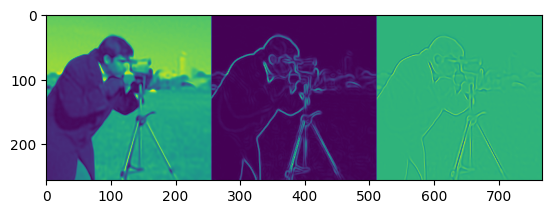

Step 300, Total loss 0.001788


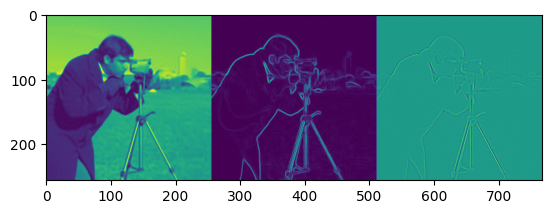

Step 400, Total loss 0.001218


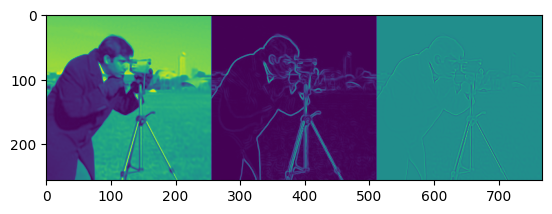

mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████▇████
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.00092
psnr,30.37833
step,499
total_params,198401


In [14]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4

cfg['total_steps'] = 500
cfg['steps_til_summary'] = 100
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'siren_baseline'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 256,
    'hidden_layers': 3,
    'outermost_linear': True,
}


seed_all(cfg.get('seed', 0))
model = Siren(**cfg['model_kwargs'])
train(model, cfg)

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   65536    |
|  net.1.linear.bias  |    256     |
| net.2.linear.weight |   65536    |
|  net.2.linear.bias  |    256     |
| net.3.linear.weight |   65536    |
|  net.3.linear.bias  |    256     |
|     net.4.weight    |    256     |
|      net.4.bias     |     1      |
+---------------------+------------+
Total Trainable Params: 198401 type <class '__main__.Siren'>


Step 0, Total loss 0.325139


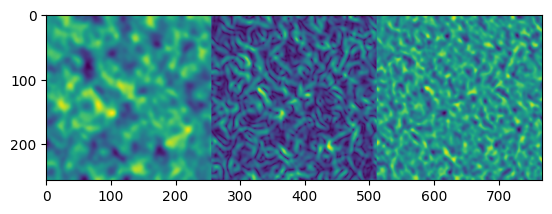

Step 1000, Total loss 0.000298


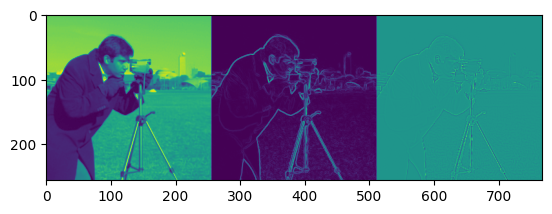

Step 2000, Total loss 0.000101


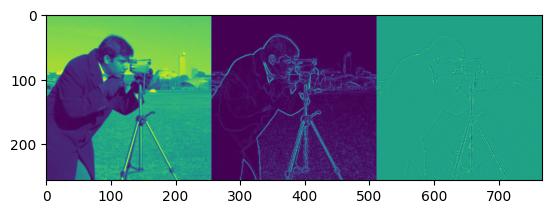

Step 3000, Total loss 0.000016


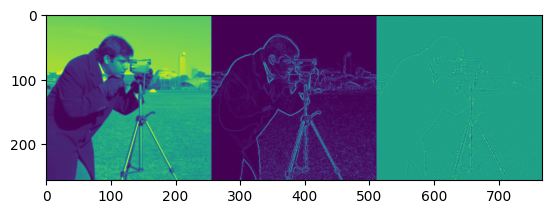

Step 4000, Total loss 0.000033


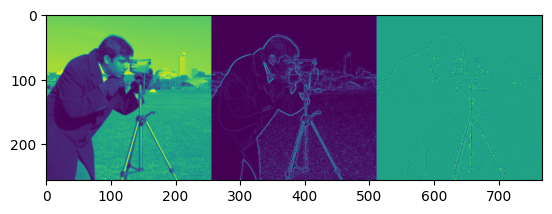

Step 5000, Total loss 0.000005


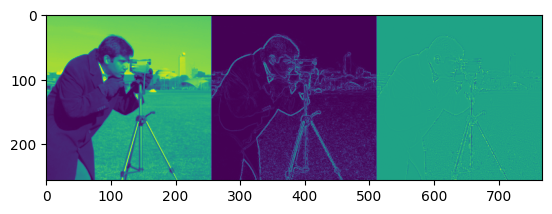

Step 6000, Total loss 0.000268


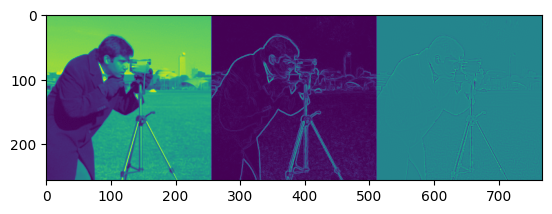

Step 7000, Total loss 0.000026


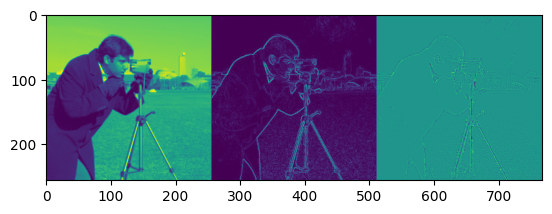

Step 8000, Total loss 0.000003


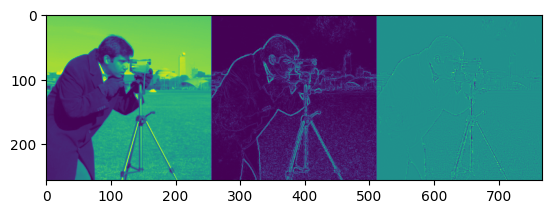

Step 9000, Total loss 0.000014


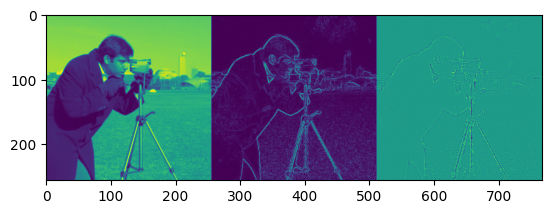

mse,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▂▃▃▄▄▄▅▅▅▆▅▅▆▆▆▅▆▆▆▇▇▆▆▅▆▆▇▇▇▇██▇▅▇█▆█▆
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,1e-05
psnr,52.68601
step,9999
total_params,198401


In [15]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'siren_baseline'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 256,
    'hidden_layers': 3,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = Siren(**cfg['model_kwargs'])
train(model, cfg)

In [16]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        # self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   65536    |
|  net.1.linear.bias  |    256     |
| net.2.linear.weight |   65536    |
|  net.2.linear.bias  |    256     |
| net.3.linear.weight |   65536    |
|  net.3.linear.bias  |    256     |
|     net.4.weight    |    256     |
|      net.4.bias     |     1      |
+---------------------+------------+
Total Trainable Params: 198401 type <class '__main__.Siren'>


Step 0, Total loss 0.326468


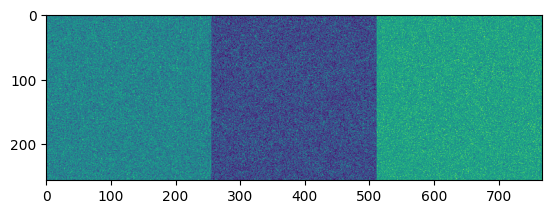

Step 1000, Total loss 0.001123


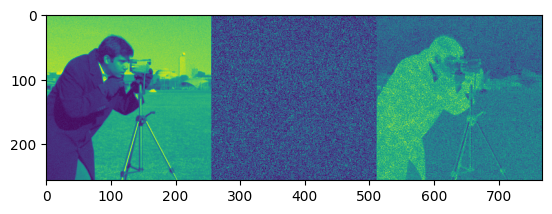

Step 2000, Total loss 0.000800


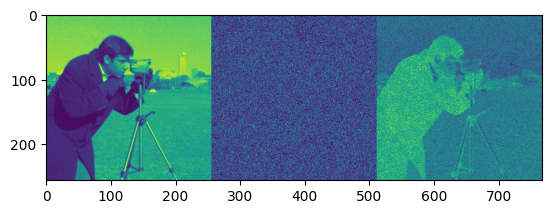

Step 3000, Total loss 0.005692


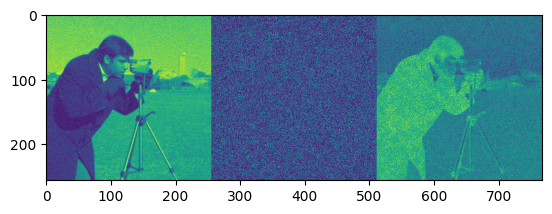

Step 4000, Total loss 0.001054


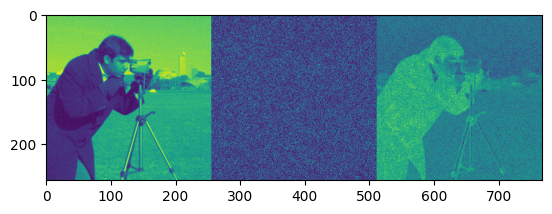

Step 5000, Total loss 0.000001


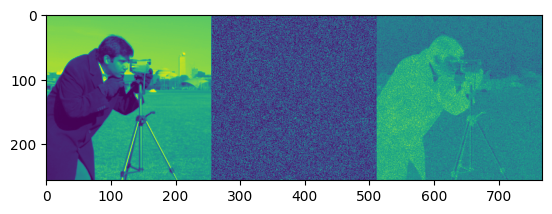

Step 6000, Total loss 0.000001


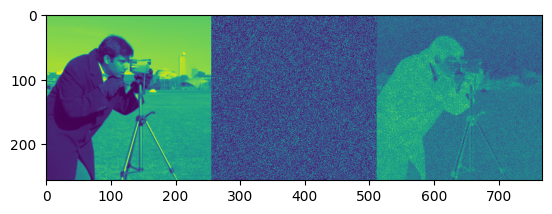

Step 7000, Total loss 0.002491


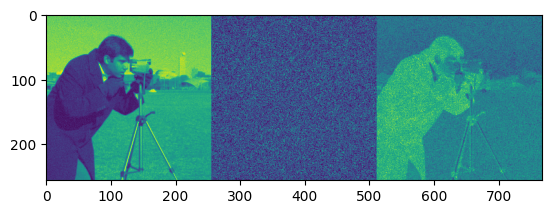

Step 8000, Total loss 0.001187


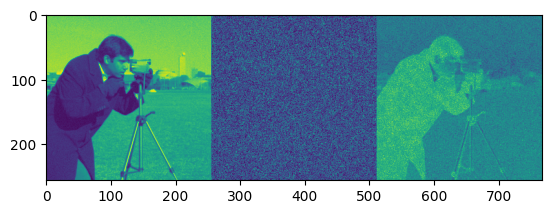

Step 9000, Total loss 0.000081


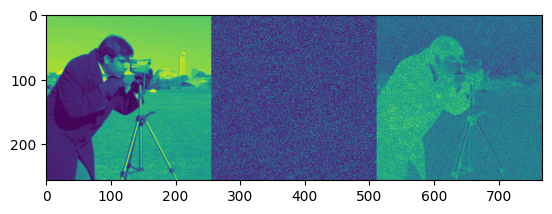

mse,██▆▁▁▁▇▄▁▁▁▁▁▅▁▁▁▁▄▁▁▁▁▂▁▁▁▁▆▁▁▁▁▁▁▁▁▁▁▄
psnr,▁▁▁▄▄▃▁▁▄▄▄▃▃▁█▄▄▃▁█▅▄▃▂█▄▄▃▁█▅▄▄▄▅▆▄▄▃▁
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.06187
psnr,12.0853
step,9999
total_params,198401


In [17]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'siren_no_init'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 256,
    'hidden_layers': 3,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = Siren(**cfg['model_kwargs'])
train(model, cfg)

# uber inr

In [18]:
class UberLayer(nn.Module):
    def __init__(self, input_dim, h=32):
        super().__init__()
        self.linear = nn.Linear(input_dim, h*4)
        self.h = h
        
    def forward(self, x):
        h = self.h
        o = self.linear(x)
        o = o[..., :h].sigmoid() * o[..., h:2*h].tanh() * o[..., 2*h:3*h].sin() * o[..., 3*h:4*h].cos()
        return o


class UberNet(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
  
        self.net += [UberLayer(in_features, hidden_features)]
        self.net += [UberLayer(hidden_features, hidden_features) for _ in range(hidden_layers)]
        self.net += [UberLayer(hidden_features, out_features)]
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    256     |
|  net.0.linear.bias  |    128     |
| net.1.linear.weight |    4096    |
|  net.1.linear.bias  |    128     |
| net.2.linear.weight |    4096    |
|  net.2.linear.bias  |    128     |
| net.3.linear.weight |    4096    |
|  net.3.linear.bias  |    128     |
| net.4.linear.weight |    4096    |
|  net.4.linear.bias  |    128     |
| net.5.linear.weight |    4096    |
|  net.5.linear.bias  |    128     |
| net.6.linear.weight |    4096    |
|  net.6.linear.bias  |    128     |
| net.7.linear.weight |    128     |
|  net.7.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 25860 type <class '__main__.UberNet'>


Step 0, Total loss 0.324081


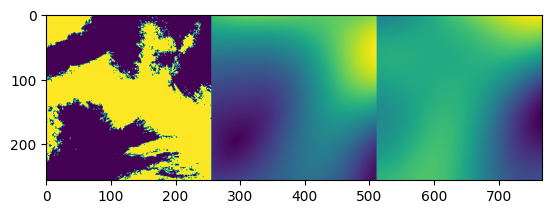

Step 1000, Total loss 0.323952


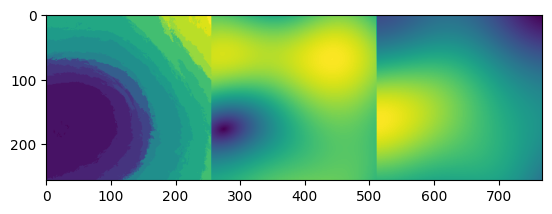

Step 2000, Total loss 0.323952


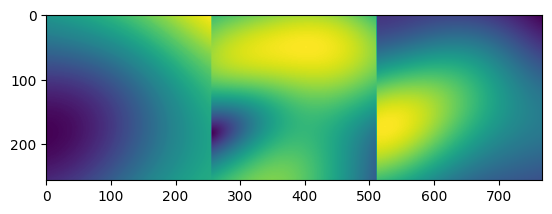

Step 3000, Total loss 0.081442


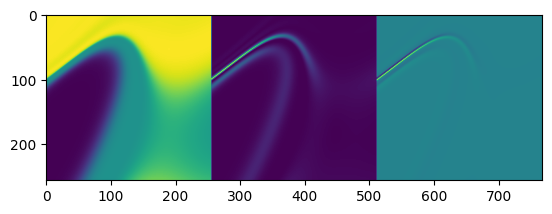

Step 4000, Total loss 0.065775


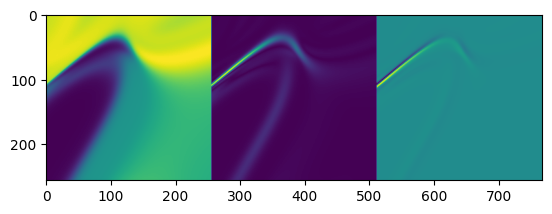

Step 5000, Total loss 0.048553


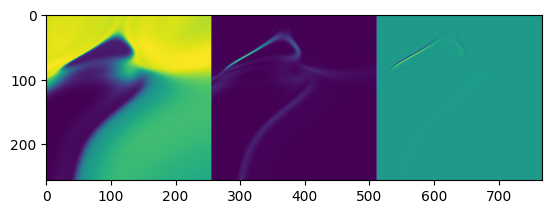

Step 6000, Total loss 0.038932


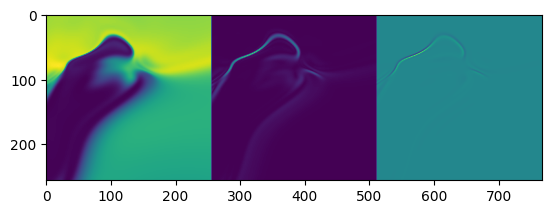

Step 7000, Total loss 0.034660


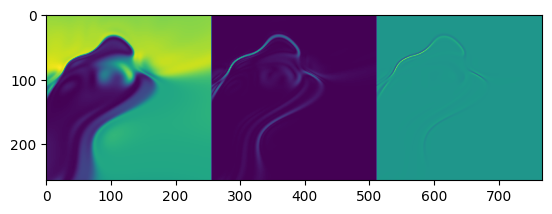

Step 8000, Total loss 0.031301


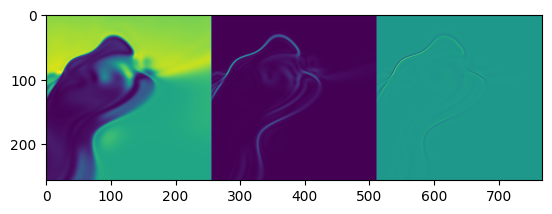

Step 9000, Total loss 0.028132


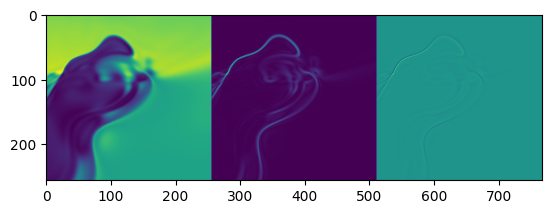

mse,██████████▆▆▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▁▁▁▁▁▁▁▁▂▂▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.02371
psnr,16.25051
step,9999
total_params,25860


In [19]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_baseline'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 32,
    'hidden_layers': 6,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNet(**cfg['model_kwargs'])
train(model, cfg)

In [20]:
# ! pip install random-fourier-features-pytorch
import rff

# X = torch.randn((256, 256, 2))


In [21]:
class UberNetWithEncoding(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, encoded_size, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
  
        self.net += [UberLayer(encoded_size*2, hidden_features)]
        self.net += [UberLayer(hidden_features, hidden_features) for _ in range(hidden_layers)]
        self.net += [UberLayer(hidden_features, out_features)]
        
        self.net = nn.Sequential(*self.net)
        
        self.encoding = rff.layers.GaussianEncoding(sigma=10.0, input_size=2, encoded_size=encoded_size)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        i = self.encoding(coords)
        output = self.net(i)
        return output, coords    

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |   16384    |
|  net.0.linear.bias  |    128     |
| net.1.linear.weight |    4096    |
|  net.1.linear.bias  |    128     |
| net.2.linear.weight |    4096    |
|  net.2.linear.bias  |    128     |
| net.3.linear.weight |    4096    |
|  net.3.linear.bias  |    128     |
| net.4.linear.weight |    4096    |
|  net.4.linear.bias  |    128     |
| net.5.linear.weight |    4096    |
|  net.5.linear.bias  |    128     |
| net.6.linear.weight |    4096    |
|  net.6.linear.bias  |    128     |
| net.7.linear.weight |    128     |
|  net.7.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 41988 type <class '__main__.UberNetWithEncoding'>


Step 0, Total loss 0.324181


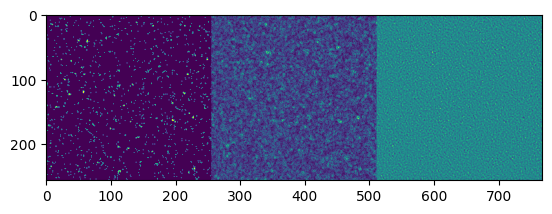

/opt/conda/lib/python3.7/site-packages/torch/autograd/__init__.py:199: UserWarning: operator() profile_node %418 : int[] = prim::profile_ivalue(%416)
 does not have profile information (Triggered internally at ../torch/csrc/jit/codegen/cuda/graph_fuser.cpp:105.)
  allow_unreachable=True, accumulate_grad=True)  # Calls into the C++ engine to run the backward pass


Step 1000, Total loss 0.323952


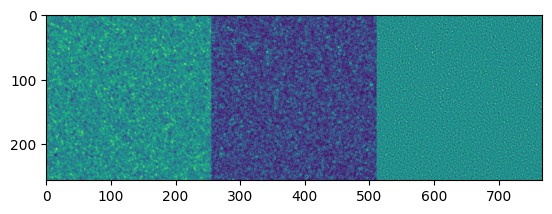

Step 2000, Total loss 0.323952


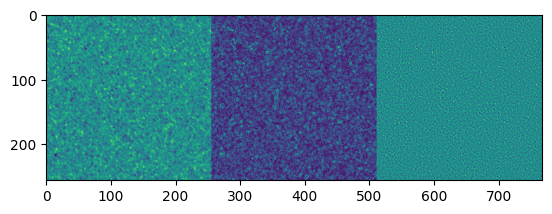

Step 3000, Total loss 0.323952


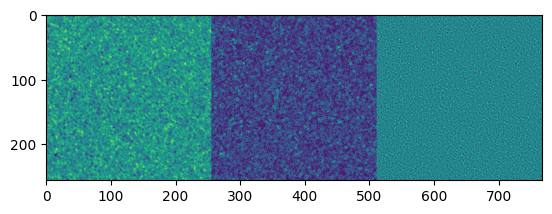

Step 4000, Total loss 0.323952


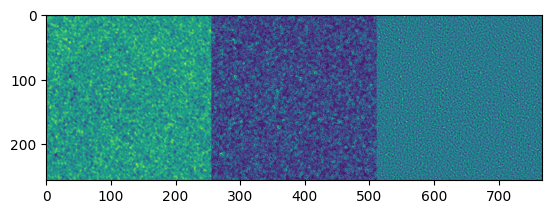

Step 5000, Total loss 0.166985


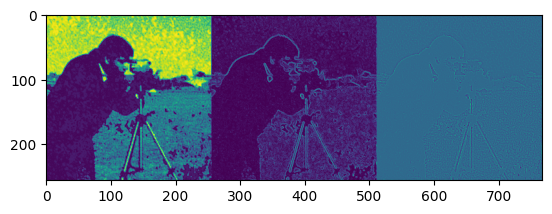

Step 6000, Total loss 0.005170


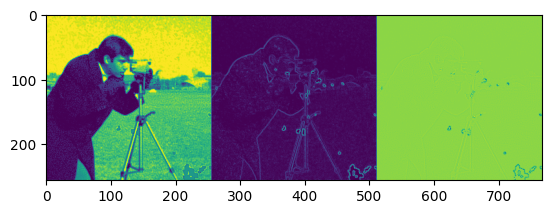

Step 7000, Total loss 0.003732


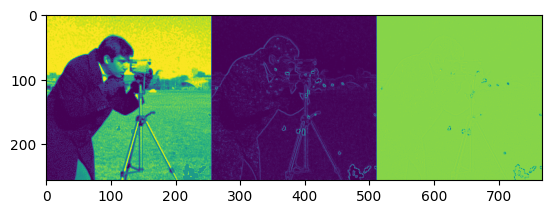

Step 8000, Total loss 0.003080


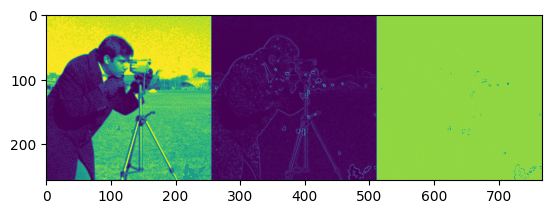

Step 9000, Total loss 0.002662


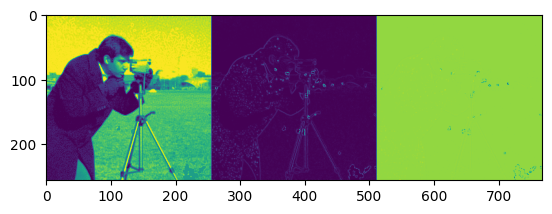

mse,██████████████████▅▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▅▆▇▇▇▇▇▇▇▇██████████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.00229
psnr,26.39883
step,9999
total_params,41988


In [22]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_posenc'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 32,
    'hidden_layers': 6,
    'encoded_size': 64,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNetWithEncoding(**cfg['model_kwargs'])
train(model, cfg)

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |   32768    |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   16384    |
|  net.1.linear.bias  |    256     |
| net.2.linear.weight |   16384    |
|  net.2.linear.bias  |    256     |
| net.3.linear.weight |   16384    |
|  net.3.linear.bias  |    256     |
| net.4.linear.weight |    256     |
|  net.4.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 83204 type <class '__main__.UberNetWithEncoding'>


Step 0, Total loss 0.324259


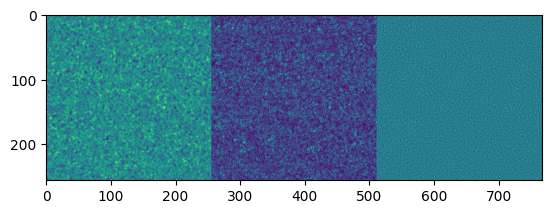

Step 1000, Total loss 0.193685


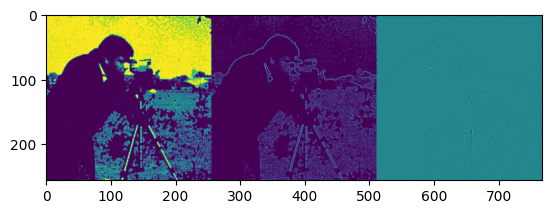

Step 2000, Total loss 0.006300


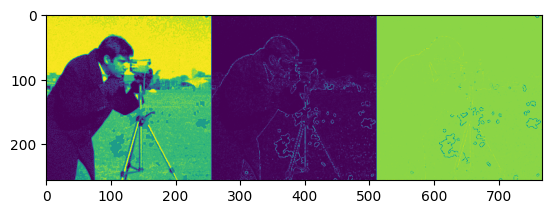

Step 3000, Total loss 0.004625


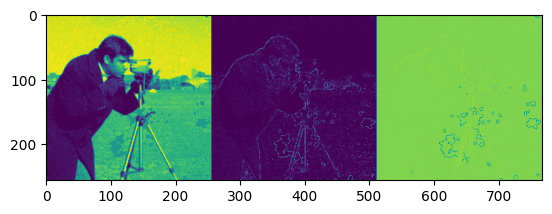

Step 4000, Total loss 0.003573


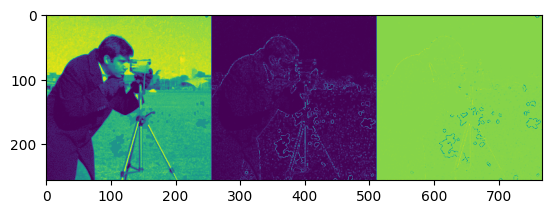

Step 5000, Total loss 0.002997


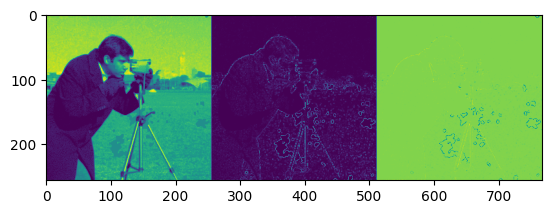

Step 6000, Total loss 0.002579


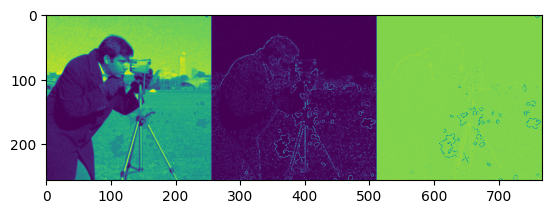

Step 7000, Total loss 0.002237


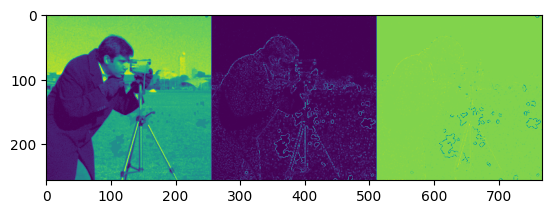

Step 8000, Total loss 0.001675


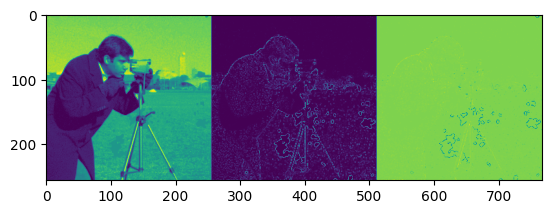

Step 9000, Total loss 0.001266


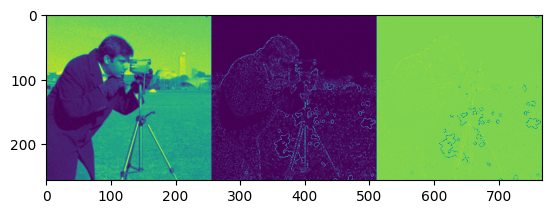

mse,███▆▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▁▂▂▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.00117
psnr,29.30851
step,9999
total_params,83204


In [23]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_posenc'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 64,
    'hidden_layers': 3,
    'encoded_size': 64,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNetWithEncoding(**cfg['model_kwargs'])
train(model, cfg)

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |   32768    |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   16384    |
|  net.1.linear.bias  |    256     |
| net.2.linear.weight |    256     |
|  net.2.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 49924 type <class '__main__.UberNetWithEncoding'>


Step 0, Total loss 0.324168


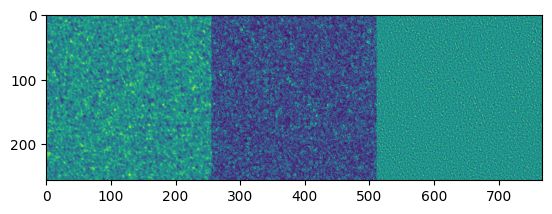

Step 1000, Total loss 0.011847


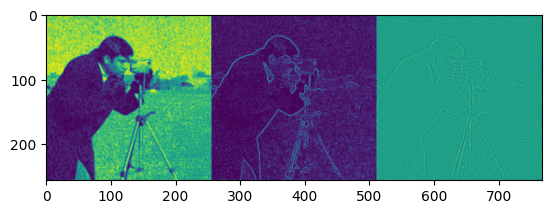

Step 2000, Total loss 0.003176


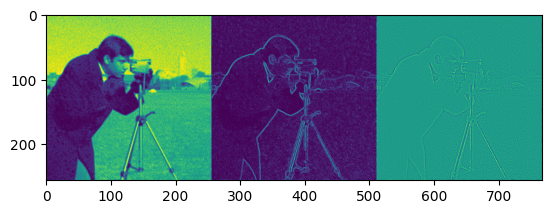

Step 3000, Total loss 0.001692


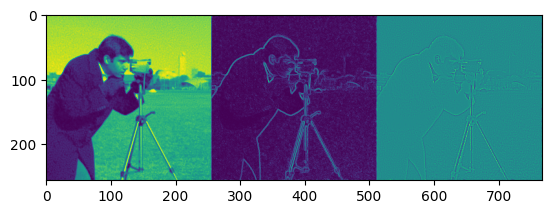

Step 4000, Total loss 0.001075


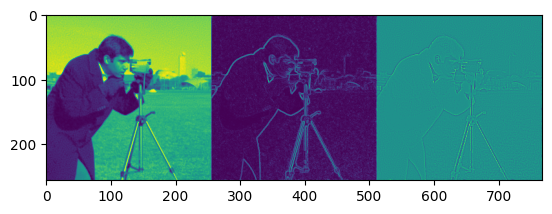

Step 5000, Total loss 0.000732


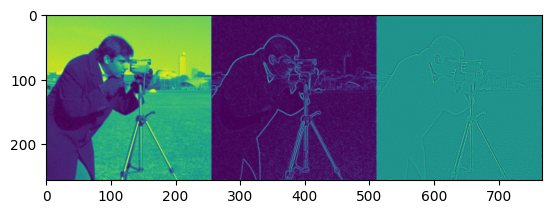

Step 6000, Total loss 0.000523


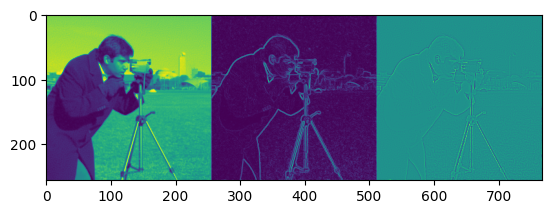

Step 7000, Total loss 0.000387


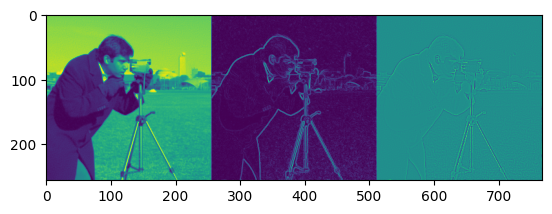

Step 8000, Total loss 0.000292


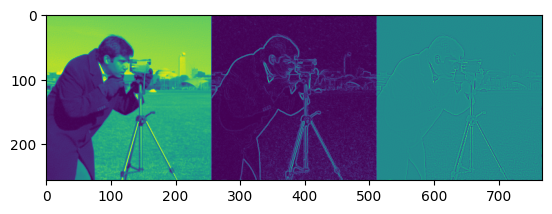

Step 9000, Total loss 0.000227


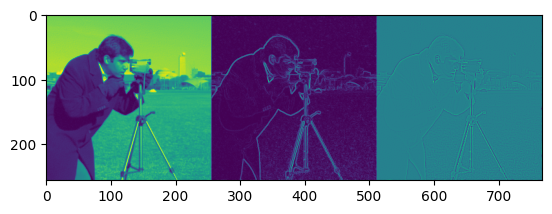

mse,██▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▂▃▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,0.00018
psnr,37.37883
step,9999
total_params,49924


In [24]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_posenc_micro'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 64,
    'hidden_layers': 1,
    'encoded_size': 64,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNetWithEncoding(**cfg['model_kwargs'])
train(model, cfg)

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |   65536    |
|  net.0.linear.bias  |    512     |
| net.1.linear.weight |   65536    |
|  net.1.linear.bias  |    512     |
| net.2.linear.weight |    512     |
|  net.2.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 132612 type <class '__main__.UberNetWithEncoding'>


Step 0, Total loss 0.324129


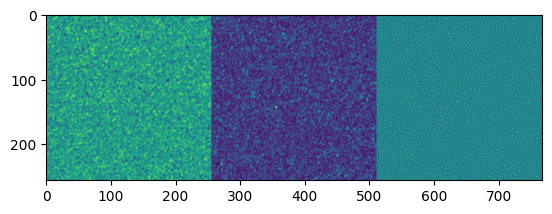

Step 1000, Total loss 0.193893


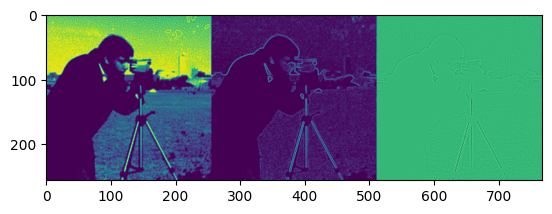

Step 2000, Total loss 0.001778


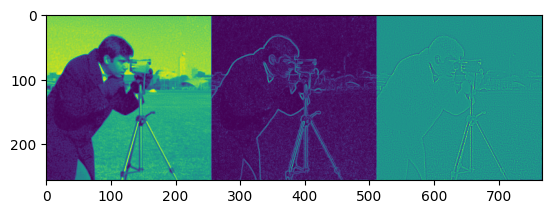

Step 3000, Total loss 0.000667


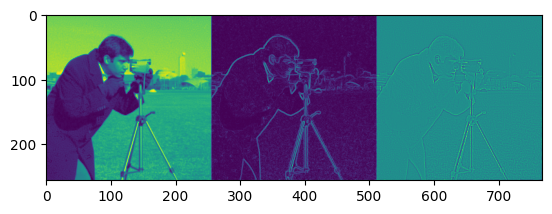

Step 4000, Total loss 0.000343


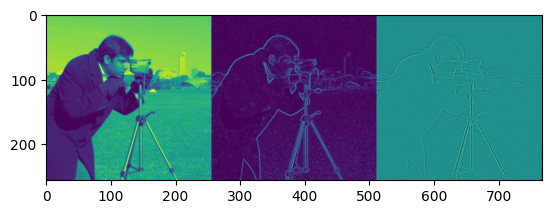

Step 5000, Total loss 0.000197


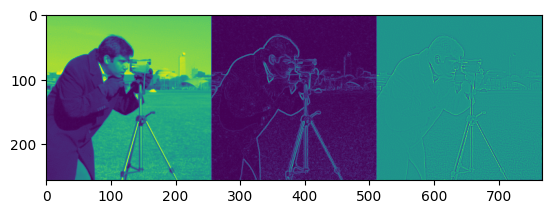

Step 6000, Total loss 0.000121


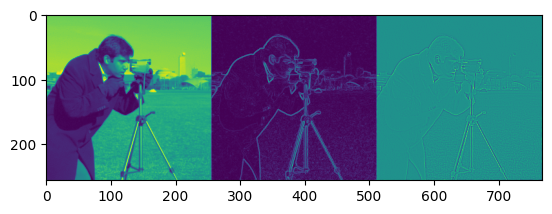

Step 7000, Total loss 0.000078


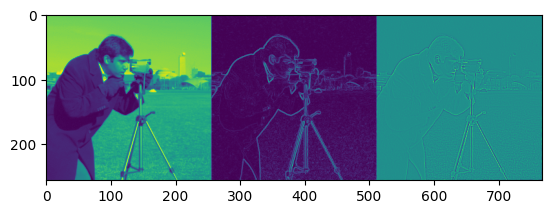

Step 8000, Total loss 0.000053


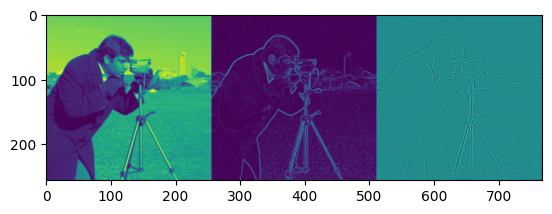

Step 9000, Total loss 0.000037


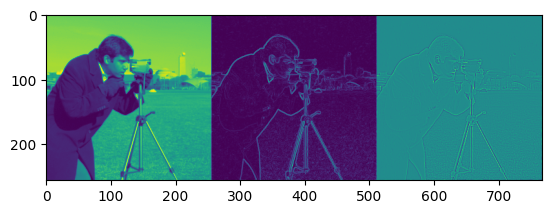

mse,█▇▅▅▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▁▁▁▁▃▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,3e-05
psnr,45.73483
step,9999
total_params,132612


In [25]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_posenc_micro_128'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 128,
    'hidden_layers': 1,
    'encoded_size': 64,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNetWithEncoding(**cfg['model_kwargs'])
train(model, cfg)

+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |   65536    |
|  net.0.linear.bias  |    512     |
| net.1.linear.weight |    512     |
|  net.1.linear.bias  |     4      |
+---------------------+------------+
Total Trainable Params: 66564 type <class '__main__.UberNetWithEncoding'>


Step 0, Total loss 0.324133


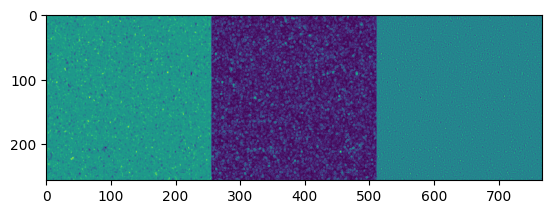

Step 1000, Total loss 0.010999


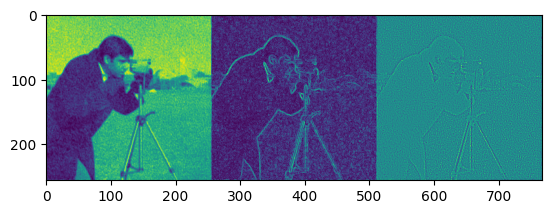

Step 2000, Total loss 0.001937


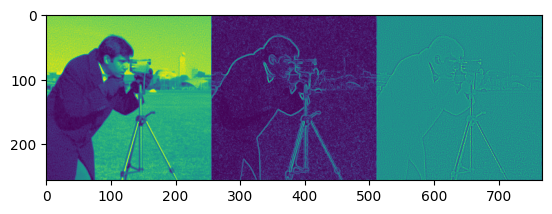

Step 3000, Total loss 0.000904


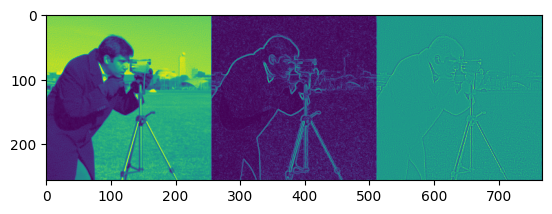

Step 4000, Total loss 0.000518


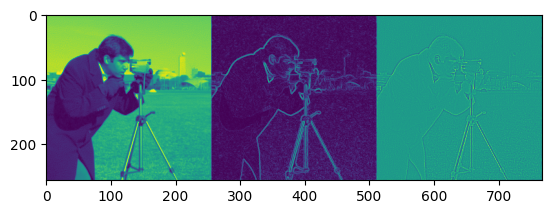

Step 5000, Total loss 0.000321


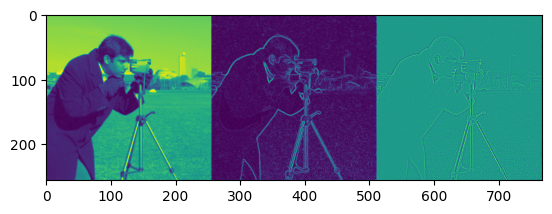

Step 6000, Total loss 0.000207


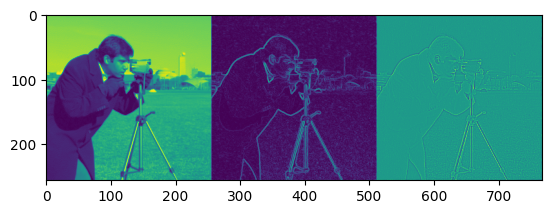

Step 7000, Total loss 0.000135


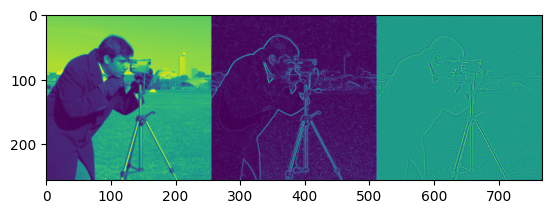

Step 8000, Total loss 0.000088


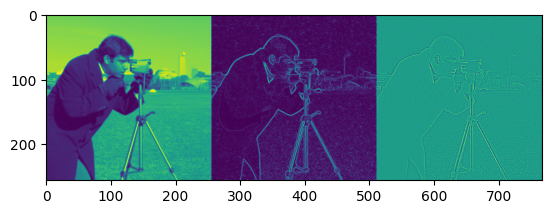

Step 9000, Total loss 0.000056


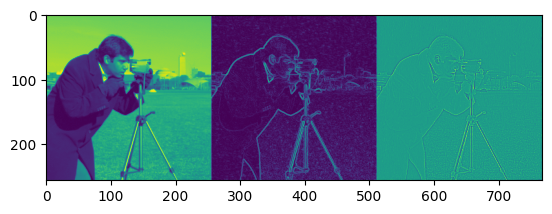

mse,█▇▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▁▂▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████
step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
mse,4e-05
psnr,44.42786
step,9999
total_params,66564


In [26]:
cfg = {}
cfg['device'] = 'cuda:3'
cfg['lr'] = 1e-4
cfg['seed'] = 0

cfg['total_steps'] = 10_000
cfg['steps_til_summary'] = 1000
cfg['project'] = 'uber_inr'
cfg['experiment_name'] = 'ubernet_posenc_2_layers'
cfg['use_wandb'] = True

cfg['model_kwargs'] = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 128,
    'hidden_layers': 0,
    'encoded_size': 64,
    'outermost_linear': True,
}

seed_all(cfg.get('seed', 0))
model = UberNetWithEncoding(**cfg['model_kwargs'])
train(model, cfg)